# 4 Data Exploration
Form hypotheses about our defined problem by visually analyzing the data.

Before we dive into Exploratory Data Analysis (EDA), it's importtant to first get sense of where EDA fits in the whole data science process.

![](images/eda_process.png)

Image inspired by [Farecaster at English Wikipeda](https://commons.wikimedia.org/wiki/File:Data_visualization_process_v1.png)

## Import Libraries

In [1]:
# Basic import(s)
import pandas as pd
import numpy as np

# Library to create a fully dataset report
#import sys
#!{sys.executable} -m pip install pandas-profiling
from pandas_profiling import ProfileReport
#!{sys.executable} -m pip install ipywidgets

# Visualization libraries
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Helper script(s)
from scripts.functions import get_line_equation, remove_outliers

# Normality test
from scipy.stats import shapiro

# Hide all warnings in ipython
import warnings
warnings.filterwarnings('ignore')

## Import Cleaned Datasets

In [2]:
# Loading of the known.csv dataset via pandas.
known_dataset = pd.read_csv('data/cleaned_known.csv')

In [3]:
# Loading of the unknown.csv dataset via pandas.
unknown_dataset = pd.read_csv('data/cleaned_unknown.csv')

In [4]:
# Show head for known_dataset.
# We want to make sure that the known.csv dataset has been read in correctly.
known_dataset.head()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
0,14.25,52.17,11,2403.0,890,344,3.0000,497.0,120800,1
1,14.11,52.20,15,5644.0,2659,783,6.7559,757.0,312000,2
2,14.26,52.10,52,2084.0,1438,516,2.3087,550.0,258600,3
3,11.47,53.09,32,3011.0,1287,525,5.0605,529.0,311000,4
4,11.46,53.03,33,2824.0,1797,493,3.6359,523.0,135100,5


In [5]:
# Show head for unknown_dataset.
# We want to make sure that the unknown.csv dataset has been read in correctly.
unknown_dataset.head()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
0,13.28,52.63,34,3850,1619,602,5.0465,608.0,0,1
1,13.31,52.45,21,5041,2719,1420,3.5335,1491.0,0,2
2,13.39,52.40,52,1509,674,244,4.9306,225.0,0,3
3,13.46,52.59,42,1291,1535,332,1.9083,345.0,0,4
4,13.22,52.51,27,4742,1682,696,6.1940,775.0,0,5


## Preparation

In [6]:
# Import readed .csv dataset into DataFrame.
known_dataset=pd.DataFrame(known_dataset)
unknown_dataset=pd.DataFrame(unknown_dataset)

In [7]:
# Check whether the adjustments produce the desired result for known.csv dataset.
known_dataset.head()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
0,14.25,52.17,11,2403.0,890,344,3.0000,497.0,120800,1
1,14.11,52.20,15,5644.0,2659,783,6.7559,757.0,312000,2
2,14.26,52.10,52,2084.0,1438,516,2.3087,550.0,258600,3
3,11.47,53.09,32,3011.0,1287,525,5.0605,529.0,311000,4
4,11.46,53.03,33,2824.0,1797,493,3.6359,523.0,135100,5


In [8]:
# Check whether the adjustments produce the desired result for unknown.csv dataset.
unknown_dataset.head()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
0,13.28,52.63,34,3850,1619,602,5.0465,608.0,0,1
1,13.31,52.45,21,5041,2719,1420,3.5335,1491.0,0,2
2,13.39,52.40,52,1509,674,244,4.9306,225.0,0,3
3,13.46,52.59,42,1291,1535,332,1.9083,345.0,0,4
4,13.22,52.51,27,4742,1682,696,6.1940,775.0,0,5


## Generate Profile Report

Pandas profiling is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code. Besides, if this is not enough to convince us to use this tool, it also generates interactive reports in web format that can be presented to any person, even if they don’t know programming.

In short, what pandas profiling does is save us all the work of visualizing and understanding the distribution of each variable. It generates a report with all the information easily available.

In [9]:
known_dataset_profile = ProfileReport(known_dataset, title="Profile Report", explorative=True)

In [10]:
# Generate profile report of known.csv dataset.
!known_dataset_profile

'known_dataset_profile' is not recognized as an internal or external command,
operable program or batch file.


In [11]:
unknown_dataset_profile = ProfileReport(known_dataset, title="Profile Report", explorative=True)

In [12]:
# Generate profile report of unknown.csv dataset.
!unknown_dataset_profile

'unknown_dataset_profile' is not recognized as an internal or external command,
operable program or batch file.


## Exploratory Data Analysis

Exploratory Data Analysis, short EDA, refers to the critical process of performing initial investigations on data so as to discover patterns, to spot anomalies, to test hypothesis and to check assumptions with the help of summary statistics and graphical representations.

In [13]:
# Check how many values are there for the individual variables in known.csv dataset.
known_dataset.nunique()

longitude      362
latitude       284
f1              53
f2            5282
f3            3536
f4            1675
f5           10148
f6            1772
t1            3599
id           15000
dtype: int64

Interesting findings for known.csv dataset:
1. We have 15000 different data samples.
2. We have 362 different longitudes but only 284 latitudes.
3. We have f1-6 input variables.
4. We have 3599 data samles in our target variable t1.

In [14]:
# Check how many values are there for the individual variables in unknown.csv dataset.
unknown_dataset.nunique()

longitude     80
latitude      48
f1            51
f2           688
f3           668
f4           513
f5           723
f6           522
t1             1
id           767
dtype: int64

Interesting findings for unknown.csv dataset:
1. We have 767 different data samples.
2. We have 80 different longitudes but only 48 latitudes.
3. We have f1-6 input variables.
4. We have 1 target variable t1 with no data samples.

Next, we can display the distribution of the individual columns.

Small explanation of the scattering measures given:
- **count**: Indication of how many values are present in the columns (NaNs/missing values are not counted).
- **mean**: Mean value of the data.
- **std**: standard deviation of the data.
- **min**: the smallest value in the data set.
- **25%**: 25% of the data are below this value.
- **50%**: 50% of the data are below this value. This value is called the median.
- **75 %**: 75 % of the data are below this value.
- **max**: the largest expression in the data set.

In [15]:
# Get the descriptive statistics for known.csv dataset.
known_dataset.describe()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,13.469287,52.511916,28.653600,2639.268085,1427.170200,499.488733,3.879813,537.477716,207676.273200,7500.500000
std,0.735857,0.545272,12.621942,2218.542690,1156.437343,384.801426,1.906416,422.399109,115784.537784,4330.271354
min,10.810000,50.970000,0.000000,0.000000,0.000000,0.000000,0.499900,0.000000,14999.000000,1.000000
25%,13.000000,52.110000,18.000000,1446.000000,783.750000,279.000000,2.566700,296.000000,119900.000000,3750.750000
50%,13.600000,52.520000,29.000000,2125.000000,1164.000000,409.000000,3.537750,437.000000,180450.000000,7500.500000
75%,14.030000,52.980000,37.000000,3148.000000,1727.000000,606.000000,4.757925,642.250000,265800.000000,11250.250000
max,14.760000,54.650000,52.000000,39320.000000,35682.000000,6082.000000,15.000100,6445.000000,500001.000000,15000.000000


In [16]:
# Get the descriptive statistics for unknow.csv dataset.
unknown_dataset.describe()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
count,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.0,767.000000
mean,13.356310,52.525098,28.624511,2660.653194,1423.941330,508.722295,3.860446,544.365435,0.0,384.000000
std,0.394943,0.203222,12.347231,2107.192864,1052.568896,392.667356,1.936324,421.184420,0.0,221.558119
min,10.360000,51.710000,2.000000,15.000000,11.000000,2.000000,0.499900,3.000000,0.0,1.000000
25%,13.260000,52.440000,18.500000,1542.000000,830.500000,297.500000,2.596850,311.000000,0.0,192.500000
50%,13.400000,52.500000,29.000000,2187.000000,1190.000000,410.000000,3.530200,439.000000,0.0,384.000000
75%,13.530000,52.570000,37.000000,3190.000000,1732.000000,621.000000,4.705100,658.500000,0.0,575.500000
max,13.860000,54.060000,52.000000,22128.000000,10450.000000,3832.000000,15.000100,4095.000000,0.0,767.000000


In statistics, **linear regression** is an approach for modeling the relationship between a response variable $y$ and one or more explanatory variables.  
Important: Linear regression can prove a relationship, but it **cannot prove causality**!

We want to model the relationship between `t1` and `f1-6` with a straight line.

First, let's look at a scatterplot to get an idea. Scatterplots are useful for interpreting trends in statistical data. Each observation (or point) in scatterplot has two coordinates. The first corresponds to the first piece of data in the pair (that's the X-coordinate; the amount that we go left or right). The second coordinate corresponds to the second piece of data in the pair (that's the y-coordinate; the amount that we go up or down). The point representing that observation is placed at the intersection of the two coordinates.

But notice: Scatterplots show possible associations or relationships between two variables. However, just because our graph or chart shows something is going on, it doesn't mean that a cause-and-effect relationship exists.

### Intercept And Slope

The slope indicates the steepness of a line and the intercept indicates the location where it intersects an axis. The slope and the intercept define the linear relationship between two variables, and can be used to estimate an average rate of change. The greater the magnitude of the slope, the steeper the line and the greater the rate of change. 

What is our guess for intercept and slope?

We try to find the line of best fit. Linear regression is the best way to do that.

* So we are looking for the slope and intercept that defines a line that fits the data as well as possible 

    **Intercept** - The value for $y$ when $x=0$ 

    **slope** - For each unit increase in $x$, the expected increase/decrease in $y$ (in the case of multiple linear regression, we need to add "holding all other explanatory variables 
    constant", since there are more than one exaplanatory variable in the model.)  
    
* 'As well as possible' often means that we are trying to minimize the sum of squared residuals.

* Below we will write a function which will find the line between two points (we already imported the helper script in the top of this notebook from `/script/helper.py`).

![](https://www.mathsisfun.com/algebra/images/graph-2-points-b.gif)

In [17]:
# Calculate the intercept and slope of a line between two points.
known_dataset1 = [known_dataset.f1[1],known_dataset.t1[1]]
known_dataset2 = [known_dataset.f1[2],known_dataset.t1[2]]
slope, intercept = get_line_equation(p1=known_dataset1, p2=known_dataset2) 
print('intercept: ', intercept)
print('slope: ', slope)

intercept:  333648.64864864864
slope:  -1443.2432432432433


Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

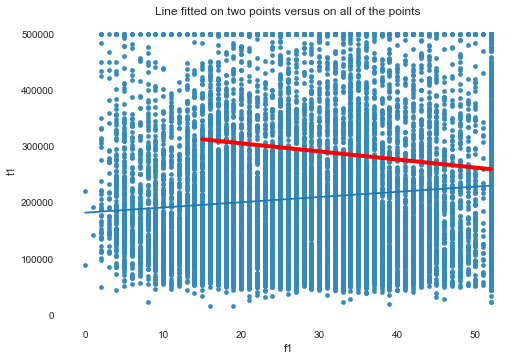

In [18]:
# Plot line fitted on two points versus on all of the points of input variable f1.
fig = known_dataset.plot(x='f1', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.f1), np.poly1d(np.polyfit(known_dataset.f1, known_dataset.t1, 1))(np.unique(known_dataset.f1)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

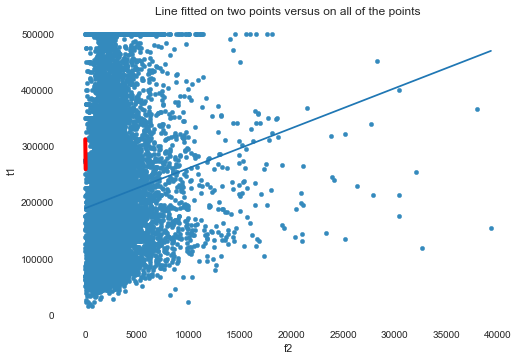

In [19]:
# Plot line fitted on two points versus on all of the points of input variable f2.
fig = known_dataset.plot(x='f2', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.f2), np.poly1d(np.polyfit(known_dataset.f2, known_dataset.t1, 1))(np.unique(known_dataset.f2)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

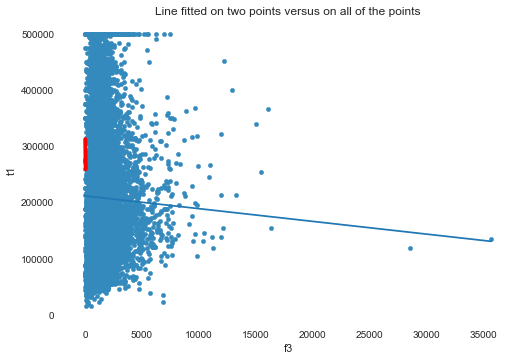

In [20]:
# Plot line fitted on two points versus on all of the points of input variable f3.
fig = known_dataset.plot(x='f3', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.f3), np.poly1d(np.polyfit(known_dataset.f3, known_dataset.t1, 1))(np.unique(known_dataset.f3)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

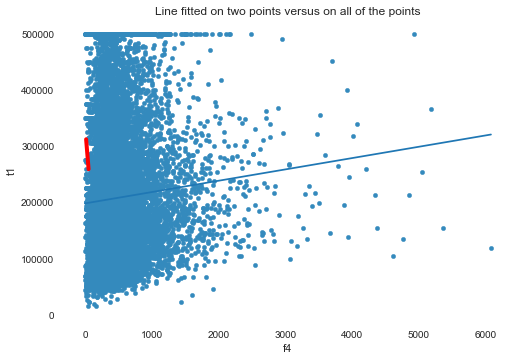

In [21]:
# Plot line fitted on two points versus on all of the points of input variable f4.
fig = known_dataset.plot(x='f4', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.f4), np.poly1d(np.polyfit(known_dataset.f4, known_dataset.t1, 1))(np.unique(known_dataset.f4)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

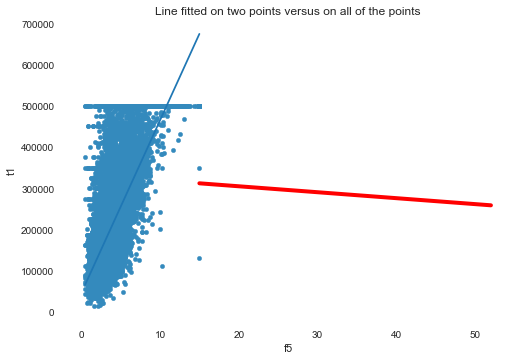

In [22]:
# Plot line fitted on two points versus on all of the points of input variable f5.
fig = known_dataset.plot(x='f5', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.f5), np.poly1d(np.polyfit(known_dataset.f5, known_dataset.t1, 1))(np.unique(known_dataset.f5)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

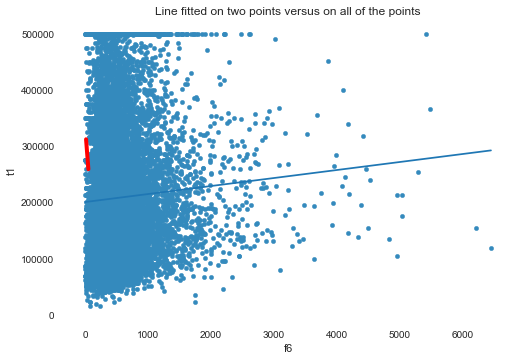

In [23]:
# Plot line fitted on two points versus on all of the points of input variable f6.
fig = known_dataset.plot(x='f6', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.f6), np.poly1d(np.polyfit(known_dataset.f6, known_dataset.t1, 1))(np.unique(known_dataset.f6)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

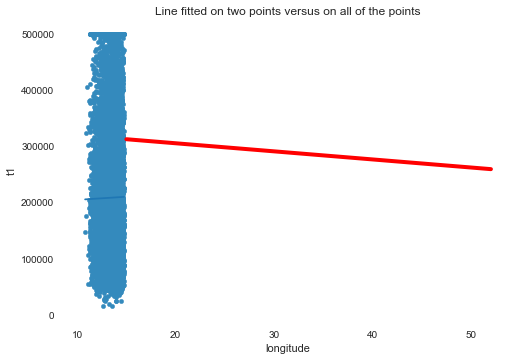

In [24]:
# Plot line fitted on two points versus on all of the points of input variable longitude.
fig = known_dataset.plot(x='longitude', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.longitude), np.poly1d(np.polyfit(known_dataset.longitude, known_dataset.t1, 1))(np.unique(known_dataset.longitude)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

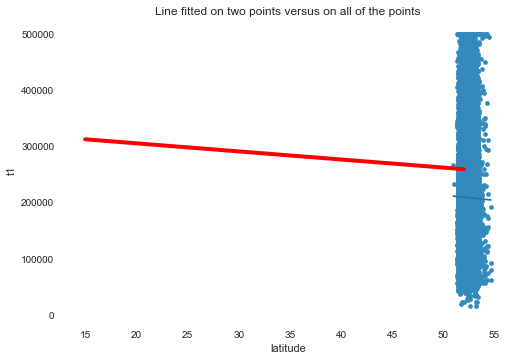

In [25]:
# Plot line fitted on two points versus on all of the points of input variable latitude.
fig = known_dataset.plot(x='latitude', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.latitude), np.poly1d(np.polyfit(known_dataset.latitude, known_dataset.t1, 1))(np.unique(known_dataset.latitude)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

Text(0.5, 1.0, 'Line fitted on two points versus on all of the points')

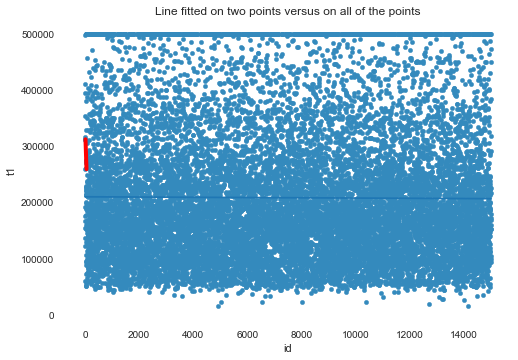

In [26]:
# Plot line fitted on two points versus on all of the points of input variable id.
fig = known_dataset.plot(x='id', 
                y='t1', 
                kind='scatter')
# Plot the linear regression line.
plt.plot(np.unique(known_dataset.id), np.poly1d(np.polyfit(known_dataset.id, known_dataset.t1, 1))(np.unique(known_dataset.id)))
# Plot the line between two points.
plt.plot([known_dataset1[0], known_dataset2[0]], [known_dataset1[1], known_dataset2[1]], color="red", linewidth=4)
plt.title("Line fitted on two points versus on all of the points")

### Histogram

With the help of the histograms, we can quickly see how the data is distributed, but also whether it is categorical.

In [27]:
# Selection of certain variables we want a closer look at.
columns_histogram = ['longitude', 'latitude', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 't1', 'id']

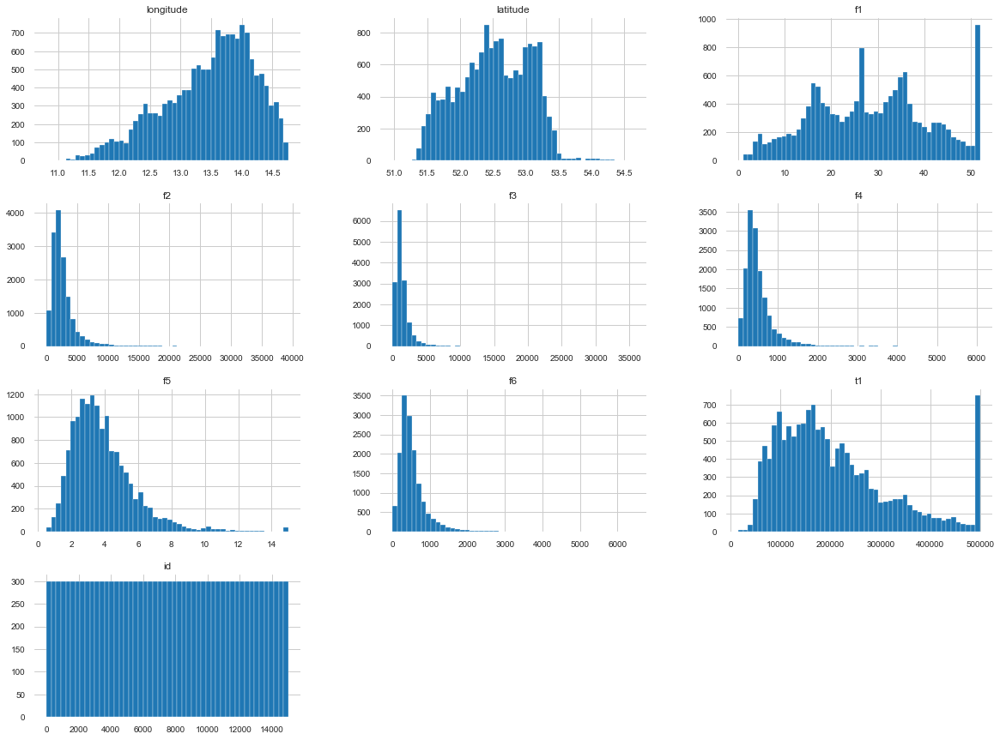

In [28]:
# Plotting of Histograms of known.csv dataset.
known_dataset[columns_histogram].hist(bins=50, figsize = (20,15)) 
plt.show()
%matplotlib inline

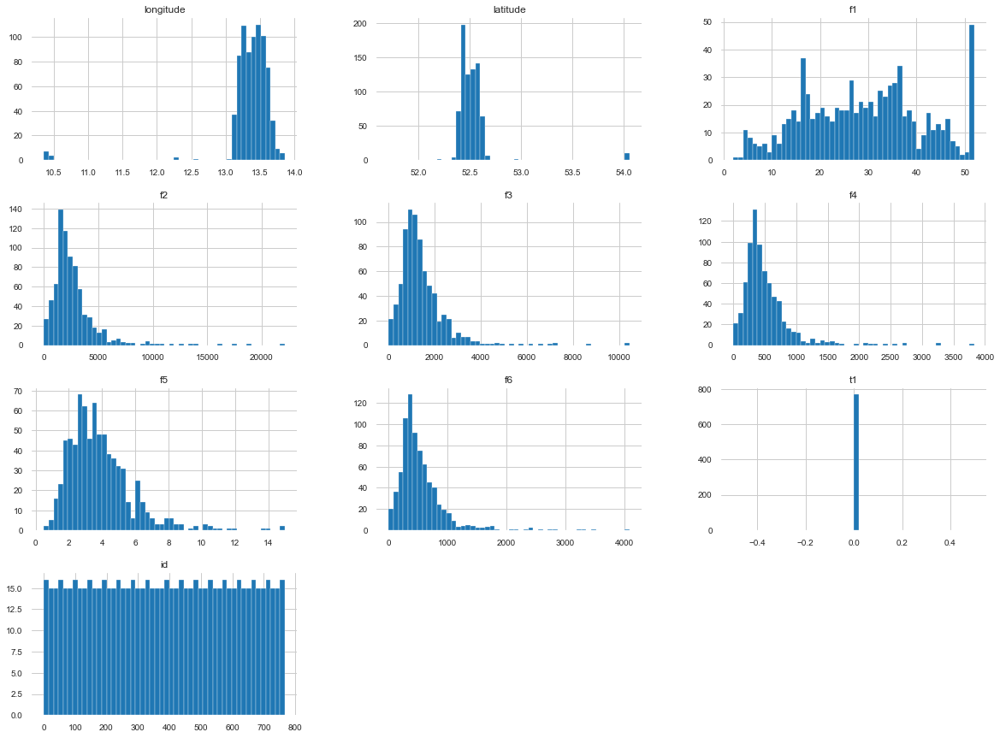

In [29]:
# Plotting of Histograms of unknown.csv dataset.
unknown_dataset[columns_histogram].hist(bins=50, figsize = (20,15)) 
plt.show()
%matplotlib inline

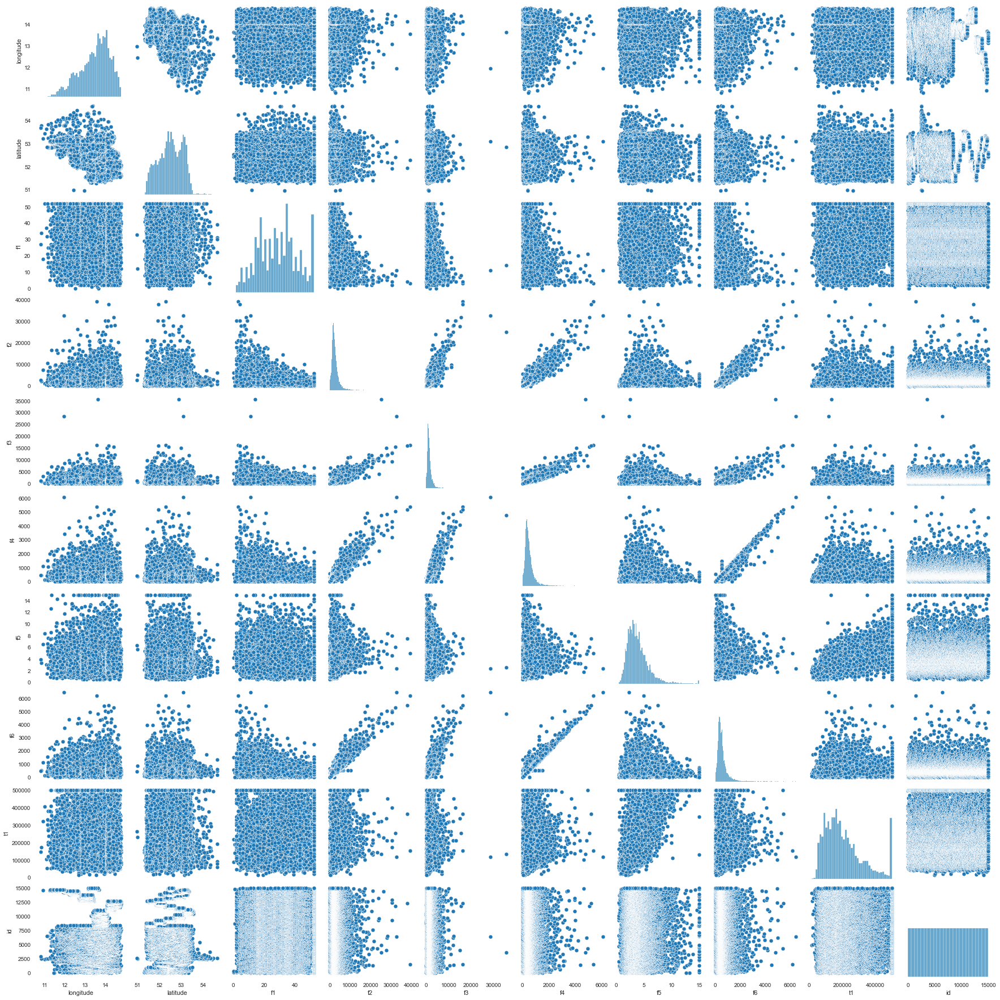

In [30]:
# Plotting of Scatterplots of known.csv dataset.
sns.pairplot(known_dataset[columns_histogram])

We checked the known.csv dataset with a pairplot. The relationship between f3 & f4, f4 & f6 seems to be pretty strong. But we want to go in more detail and verify the correlations also numerically through a heatmap.

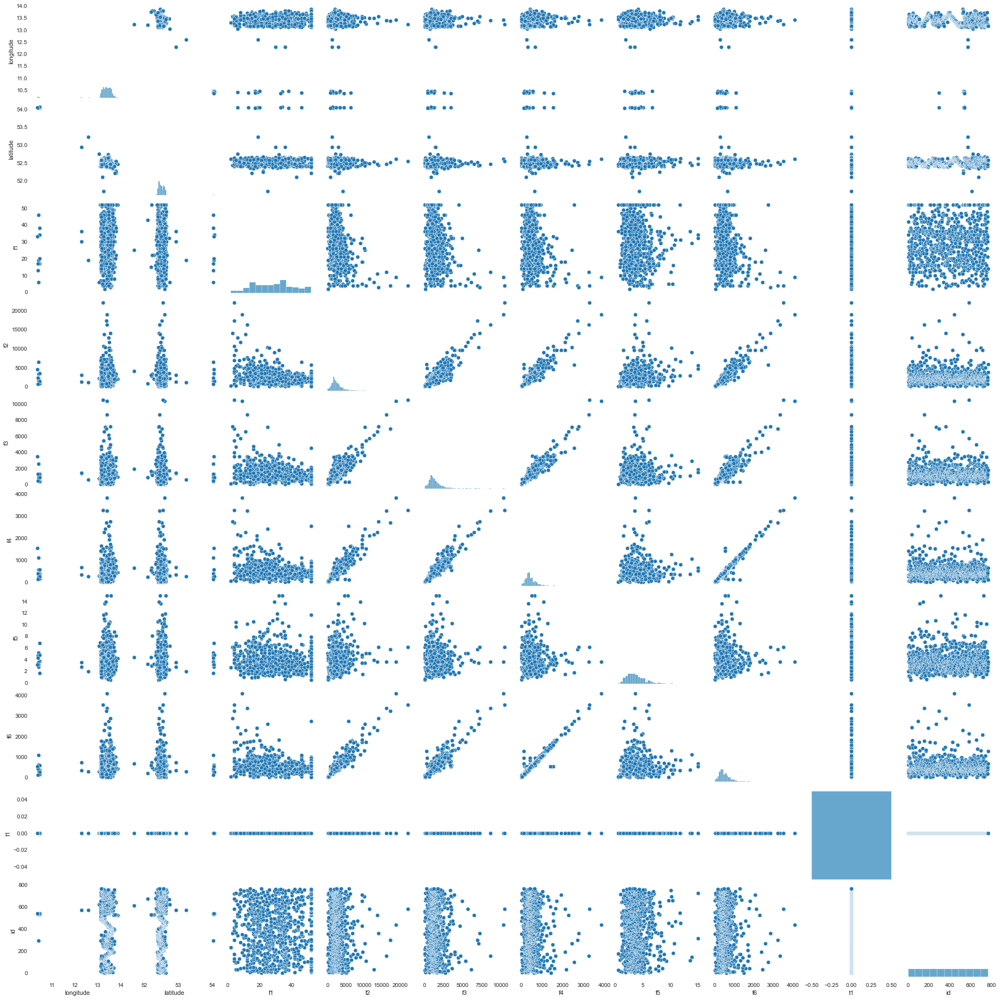

In [31]:
# Plotting of Scatterplots of unknown.csv dataset.
sns.pairplot(unknown_dataset[columns_histogram])

We checked the unknown.csv dataset with a pairplot. The relationship between f2 & f4, f2 & f6, f3 & f4 and f4 & f6 seems to be pretty strong. But we want to go in more detail and verify the correlations also numerically through a heatmap.

`In the previous sections with intercept and slope as well as the histogram, we have clearly seen that the data sets are not normally distributed. This would lead to wasted results during model training at the latest. Therefore, we make sure in advance completely whether we can reject the null hypothesis and then remove all outliers in the data set to ensure a normal distribution.`

`Why is it necessary to remove outliers from the data?
Outliers are the data points that lie away from the usual distribution of the data and causes the below effects on the overall data distribution:`

- `Affects the overall standard variation of the data.`
- `Manipulates the overall mean of the data.`
- `Converts the data to a skewed form.`
- `It causes bias in the accuracy estimation of the machine learning model.`
- `Affects the distribution and statistics of the dataset.`

`Because of the above reasons, it is necessary to detect and get rid of outliers before modelling a dataset.`

### Shapiro-Wilk-Test

The Shapiro-Wilk test is a test of normality. It is used to determine whether a sample is from a normal distribution or not.

In [32]:
shapiro(known_dataset)

ShapiroResult(statistic=0.3448828458786011, pvalue=0.0)

`From the known dataset output, we can see that the test statistic is 0.344 and the corresponding p-value is 0.0. Since the p-value is less than 0.05, we reject the null hypothesis. We have enough evidence to say that the known data sets are not from a normal distribution.`

In [33]:
shapiro(unknown_dataset)

ShapiroResult(statistic=0.5202494263648987, pvalue=0.0)

`From the unknown dataset output, we can see that the test statistic is 0.520 and the corresponding p-value is 0.0. Since the p-value is less than 0.05, we reject the null hypothesis. We have enough evidence to say that the known data sets are not from a normal distribution.`

### Detect And Remove Outliers – IQR Approach

IQR is the acronym for Interquartile Range. It measures the statistical dispersion of the data values as a measure of overall distribution.

IQR is equivalent to the difference between the first quartile (Q1) and the third quartile (Q3) respectively.

Here, Q1 refers to the first quartile i.e. 25% and Q3 refers to the third quartile i.e. 75%.

We will be using Boxplots to detect and visualize the outliers present in the dataset.
Boxplots depict the distribution of the data in terms of quartiles and consists of the following components:

- Q1-25%
- Q2-50%
- Q3-75%
- Lower bound/whisker
- Upper whisker/bound

In [34]:
# Analyse only those features.
columns_numeric =  ['longitude', 'latitude', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 't1']

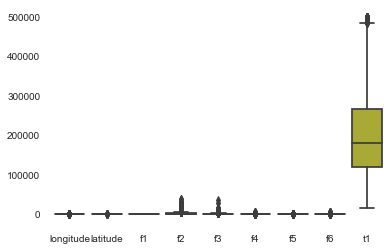

In [35]:
ax = sns.boxplot(data=known_dataset[columns_numeric])

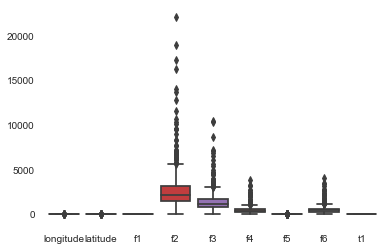

In [36]:
ax = sns.boxplot(data=unknown_dataset[columns_numeric])

In [37]:
# Removing the outliers:
remove_outliers(known_dataset, columns_numeric)
remove_outliers(unknown_dataset, columns_numeric)

`Thus, we have used numpy.percentile() method to calculate the values of Q1 and Q3. Further, we have replaced the outliers with numpy.nan as the NULL values.`

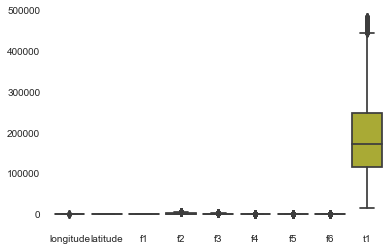

In [38]:
# Check again for outliers in known dataset:
ax = sns.boxplot(data=known_dataset[columns_numeric])

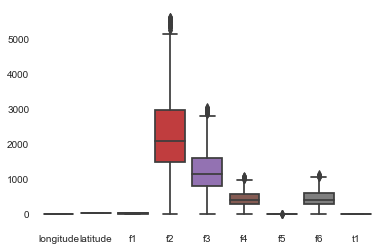

In [39]:
# Check again for outliers in unknown dataset:
ax = sns.boxplot(data=unknown_dataset[columns_numeric])

In [40]:
# Having replaced the outliers for known dataset with NaN, let us now check the sum of null values or missing values using the below code:
known_dataset.isnull().sum()

longitude     82
latitude      14
f1             0
f2           938
f3           874
f4           874
f5           498
f6           938
t1           768
id             0
dtype: int64

In [41]:
# Having replaced the outliers for unknown dataset with NaN, let us now check the sum of null values or missing values using the below code:
unknown_dataset.isnull().sum()

longitude    14
latitude     19
f1            0
f2           40
f3           38
f4           39
f5           31
f6           40
t1            0
id            0
dtype: int64

Now, we can use any of the below techniques to treat the NULL values:

In [42]:
# So we decide again to impute missing values with Mean/Median, because columns in the dataset which are having numeric continous values can be replaced with the mean, median, or mode of remaining values in the column. This method can prevent the loss of data. Replacing two approximations (mean, median) is a statistical approach to handle the missing values.
known_dataset['longitude'] = known_dataset['longitude'].replace(np.NaN, known_dataset['longitude'].mean())
known_dataset['latitude'] = known_dataset['latitude'].replace(np.NaN, known_dataset['latitude'].mean())
known_dataset['f1'] = known_dataset['f1'].replace(np.NaN, known_dataset['f1'].mean())
known_dataset['f2'] = known_dataset['f2'].replace(np.NaN, known_dataset['f2'].mean())
known_dataset['f3'] = known_dataset['f3'].replace(np.NaN, known_dataset['f3'].mean())
known_dataset['f4'] = known_dataset['f4'].replace(np.NaN, known_dataset['f4'].mean())
known_dataset['f5'] = known_dataset['f5'].replace(np.NaN, known_dataset['f5'].mean())
known_dataset['f6'] = known_dataset['f6'].replace(np.NaN, known_dataset['f6'].mean())
known_dataset['t1'] = known_dataset['t1'].replace(np.NaN, known_dataset['t1'].mean())

unknown_dataset['longitude'] = unknown_dataset['longitude'].replace(np.NaN, unknown_dataset['longitude'].mean())
unknown_dataset['latitude'] = unknown_dataset['latitude'].replace(np.NaN, unknown_dataset['latitude'].mean())
unknown_dataset['f1'] = unknown_dataset['f1'].replace(np.NaN, unknown_dataset['f1'].mean())
unknown_dataset['f2'] = unknown_dataset['f2'].replace(np.NaN, unknown_dataset['f2'].mean())
unknown_dataset['f3'] = unknown_dataset['f3'].replace(np.NaN, unknown_dataset['f3'].mean())
unknown_dataset['f4'] = unknown_dataset['f4'].replace(np.NaN, unknown_dataset['f4'].mean())
unknown_dataset['f5'] = unknown_dataset['f5'].replace(np.NaN, unknown_dataset['f5'].mean())
unknown_dataset['f6'] = unknown_dataset['f6'].replace(np.NaN, unknown_dataset['f6'].mean())
unknown_dataset['t1'] = unknown_dataset['t1'].replace(np.NaN, unknown_dataset['t1'].mean())

In [43]:
# Now all is fine again for known dataset. No Null or NaN values exists.
known_dataset.isnull().sum()

longitude    0
latitude     0
f1           0
f2           0
f3           0
f4           0
f5           0
f6           0
t1           0
id           0
dtype: int64

In [44]:
# Now all is fine again for known dataset. No Null or NaN values exists.
unknown_dataset.isnull().sum()

longitude    0
latitude     0
f1           0
f2           0
f3           0
f4           0
f5           0
f6           0
t1           0
id           0
dtype: int64

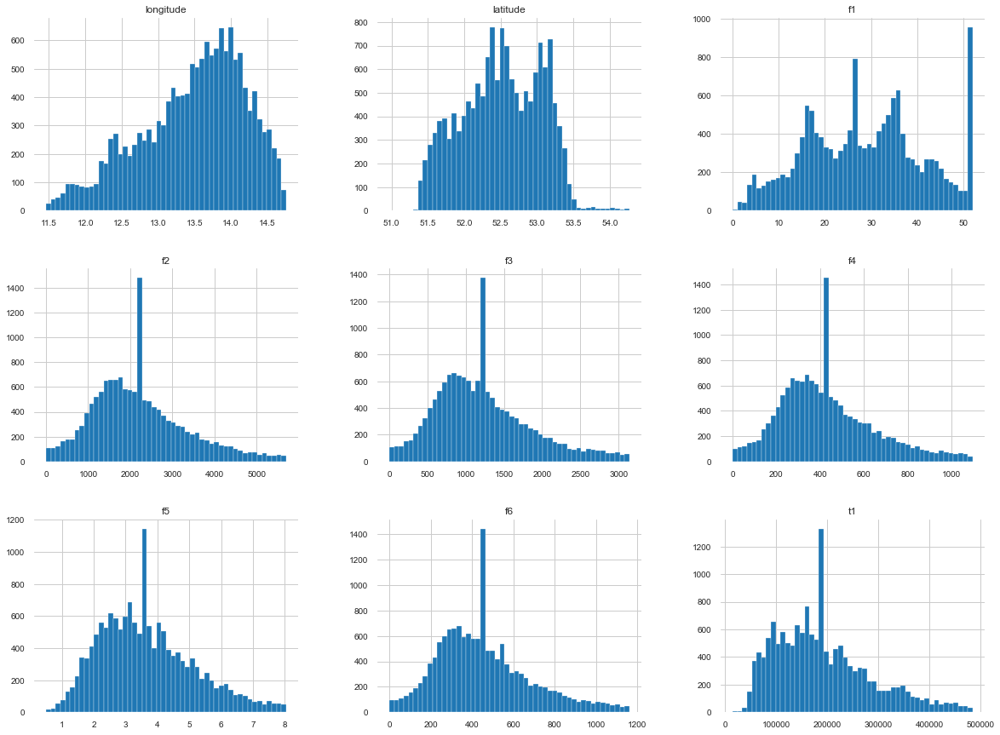

In [45]:
# Again plotting of Histograms of known.csv dataset after detection and removing outliers with IQR approach.
known_dataset[columns_numeric].hist(bins=50, figsize = (20,15)) 
plt.show()
%matplotlib inline

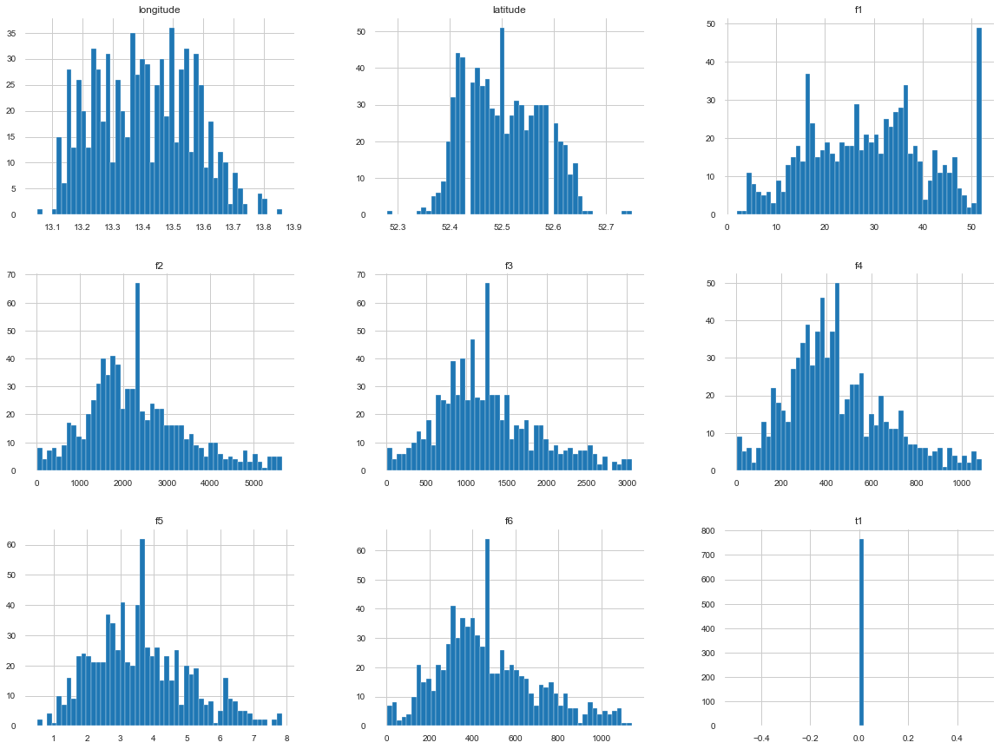

In [46]:
# Again plotting of Histograms of unknown.csv dataset after detection and removing outliers with IQR approach.
unknown_dataset[columns_numeric].hist(bins=50, figsize = (20,15)) 
plt.show()
%matplotlib inline

In [47]:
# Get the descriptive statistics after removing outliers for know.csv dataset.
known_dataset.describe()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,13.481172,52.510121,28.653600,2221.410274,1225.283732,430.147883,3.665553,457.506880,191930.965289,7500.500000
std,0.718117,0.542082,12.621942,1113.467961,626.213410,215.511266,1.471621,226.949733,93868.584344,4330.271354
min,11.460000,50.970000,0.000000,0.000000,0.000000,0.000000,0.499900,0.000000,14999.000000,1.000000
25%,13.010000,52.110000,18.000000,1446.000000,783.750000,279.000000,2.566700,296.000000,119900.000000,3750.750000
50%,13.600000,52.520000,29.000000,2125.000000,1164.000000,409.000000,3.537750,437.000000,180450.000000,7500.500000
75%,14.030000,52.980000,37.000000,2815.000000,1559.000000,545.000000,4.556800,576.000000,242525.000000,11250.250000
max,14.760000,54.270000,52.000000,5699.000000,3141.000000,1096.000000,8.040900,1161.000000,484600.000000,15000.000000


In [48]:
# Get the descriptive statistics after removing outliers for unknow.csv dataset.
unknown_dataset.describe()

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
count,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.0,767.000000
mean,13.403214,52.503596,28.624511,2301.928473,1255.226337,441.277473,3.605463,470.986642,0.0,384.000000
std,0.159312,0.072552,12.347231,1146.611171,614.088150,217.700617,1.425370,230.019469,0.0,221.558119
min,13.050000,52.280000,2.000000,15.000000,11.000000,2.000000,0.499900,3.000000,0.0,1.000000
25%,13.270000,52.440000,18.500000,1542.000000,830.500000,297.500000,2.596850,311.000000,0.0,192.500000
50%,13.403214,52.500000,29.000000,2187.000000,1190.000000,410.000000,3.530200,439.000000,0.0,384.000000
75%,13.530000,52.560000,37.000000,2914.000000,1587.000000,557.000000,4.476000,599.000000,0.0,575.500000
max,13.860000,52.750000,52.000000,5648.000000,3060.000000,1088.000000,7.860100,1141.000000,0.0,767.000000


#### Export Removed Outliers Datasets

In [49]:
# Save removed outliers from known dataset to a new .csv file
path = 'data/removed_outliers_with_IQR_known.csv'
known_dataset.to_csv(path, 
index=False) # Avoid creating an index in a saved .csv file.

In [50]:
# Save removed outliers from unknown dataset to a new .csv file
path = 'data/removed_outliers_with_IQR_unknown.csv'
unknown_dataset.to_csv(path, 
index=False) # Avoid creating an index in a saved .csv file.

### Heatmap

A different representation of the correlation (linear relationship) is achieved through a heatmap. Here, the correlation of each variable with every other variable is determined. It shows how strong the linear correlation is. Extremely strong colours indicate a strong correlation. Red indicates a positive correlation (e.g. f4 and f6), blue indicates a negative correlation (e.g. f2 and f6).

It is very interesting to see how much the individual variables influence the target variable t1. From this, one can deduce which variables are well suited to predict our target variable in a linear model.

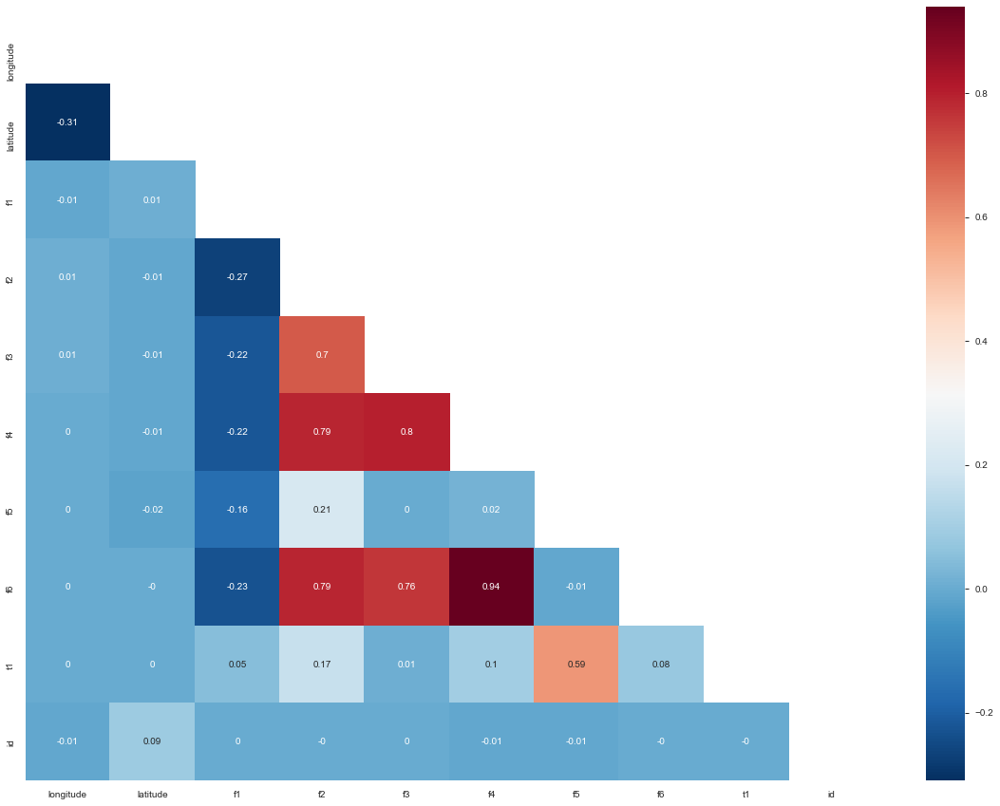

In [51]:
# Heatmap of the Pearson correlation coefficients of known.csv dataset.
mask = np.triu(known_dataset.corr())
plt.figure(figsize = (20,15))
ax = sns.heatmap(round(known_dataset.corr(), 2)
                 ,annot=True
                 ,mask=mask
                 ,cmap='RdBu_r')

We can see some important relationships on the heatmap from the known.csv dataset:
- f2 & f3 `strong` relationship (score = `0.7`),
- f2 & f4 `strong` relationship (score = `0.79`),
- f2 & f6 `strong` relationship (score = `0.79`),
- f3 & f4 `very strong` relationship (score = `0.8`),
- f3 & f6 `strong` relationship (score = `0.76`),
- f4 & f6 `very strong` relationship (score = `0.94`),
- f5 & t1 `moderate` relationship (score = `0.59`).



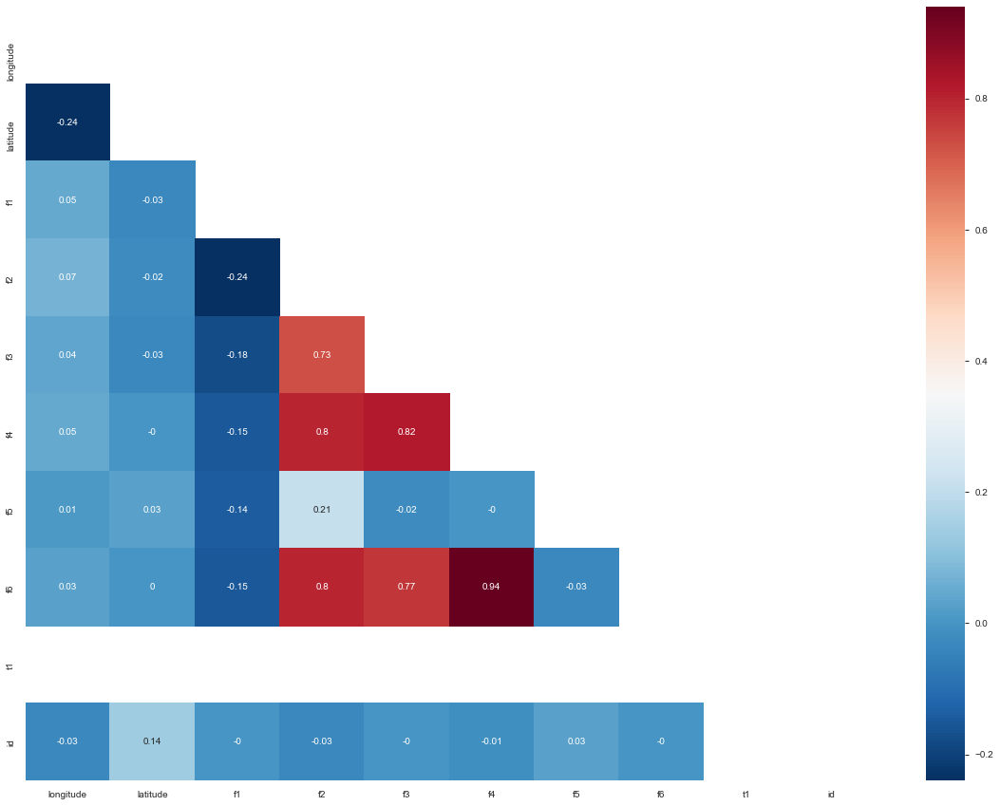

In [52]:
# Heatmap of the Pearson correlation coefficients of unknown.csv dataset.
mask = np.triu(unknown_dataset.corr())
plt.figure(figsize = (20,15))
ax = sns.heatmap(round(unknown_dataset.corr(), 2)
                 ,annot=True
                 ,mask=mask
                 ,cmap='RdBu_r')

We can see some important relationships on the heatmap from the unknown.csv dataset:

- f2 & f3 `strong` relationship (score = `0.73`),
- f2 & f4 `very strong` relationship (score = `0.8`),
- f2 & f5 `moderate` relationship (score = `0.21`),
- f2 & f6 `very strong` relationship (score = `0.8`),
- f3 & f4 `very strong` relationship (score = `0.82`),
- f3 & f6 `strong` relationship (score = `0.77`),
- f4 & f6 `very strong` relationship (score = `0.94`).



### Map

#### known.csv dataset view in scatter maxbox

In [53]:
# Test check on original t1 data sample from known dataset.
known_dataset.query('t1 == 135100')

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
4,11.46,53.03,33.0,2824.0,1797.0,493.0,3.6359,523.0,135100.0,5
12023,14.39,52.03,39.0,1986.0,1041.0,385.0,3.2333,427.0,135100.0,12024


In [54]:
# Test check on original id data sample from known dataset.
known_dataset.query('id == 621')

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
620,13.61,52.13,6.0,2445.0,1189.0,573.0,3.8958,590.0,301100.0,621


In [55]:
fig = px.scatter_mapbox(known_dataset,
                        lat="latitude",
                        lon="longitude",
                        hover_data=['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 't1', 'id'],
                        size='f5',
                        color='f5',
                        color_continuous_scale=['blue', 'grey', 'red'],
                        color_discrete_sequence=["fuchsia"],
                        zoom=6,
                        height=800)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

In [56]:
fig = px.scatter_mapbox(known_dataset, lat="latitude", lon="longitude", color="f5", hover_data=['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 't1', 'id'],
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=6, height=800,
                  mapbox_style="carto-positron")
fig.show()

In [57]:
fig = px.scatter_mapbox(known_dataset, lat="latitude", lon="longitude", hover_data=["f1", "f2", "f3", "f4", "f5", "f6", "t1", "id"],
                        color_discrete_sequence=["fuchsia"], zoom=6, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#### unknown.csv dataset view in scatter maxbox

In [58]:
# Test check on original id data sample from unknown dataset.
unknown_dataset.query('id == 621')

,longitude,latitude,f1,f2,f3,f4,f5,f6,t1,id
620,13.05,52.75,6.0,2187.0,697.0,273.0,6.2685,277.0,0.0,621


In [59]:
fig = px.scatter_mapbox(unknown_dataset,
                        lat="latitude",
                        lon="longitude",
                        hover_data=['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 't1', 'id'],
                        size='f5',
                        color='f5',
                        color_continuous_scale=['blue', 'grey', 'red'],
                        color_discrete_sequence=["fuchsia"],
                        zoom=9,
                        height=800)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

In [60]:
fig = px.scatter_mapbox(unknown_dataset, lat="latitude", lon="longitude", color="f5", hover_data=['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 't1', 'id'],  
    zoom=9, height=800,
    mapbox_style="carto-positron")
fig.show()

In [61]:
fig = px.scatter_mapbox(unknown_dataset, lat="latitude", lon="longitude", hover_data=["f5", "t1"],
                        color_discrete_sequence=["fuchsia"], zoom=9, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()